# Credit Card Fraud Detection

__Goal:__ 

Predict the probability of an online credit card transaction being fraudulent, based on different properties of the transactions. 


## 1. Setup Environment

The goal of this section is to:
- Import all the packages
- Set the options for data visualizations

other dataset: 
https://www.openml.org/search?type=data&status=active&id=45036&sort=runs


In [1]:
# Data Manipulation
import numpy as np 
import pandas as pd 

# Data Visualization
import seaborn as sns 
import matplotlib.pyplot as plt
import matplotlib.lines as mlines

# Time
import time
import datetime

# Machine Learning
from sklearn.preprocessing import LabelEncoder, minmax_scale
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score, plot_roc_curve, precision_recall_curve, plot_precision_recall_curve
from sklearn.calibration import calibration_curve
from sklearn.calibration import CalibratedClassifierCV
from sklearn.preprocessing import minmax_scale

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# imbalanced learning (more on this later)
from imblearn.over_sampling import RandomOverSampler
from scipy.stats import chi2_contingency,  f_oneway

import gc
import warnings
from tqdm import tqdm

# Set Options
pd.set_option('display.max_rows', 800)
pd.set_option('display.max_columns', 500)
%matplotlib inline
warnings.filterwarnings("ignore")

Upload the zip file into the left column. Then unzip it;

Good practice to use zip files to speed things up. Also Colab is not run on your own environment (local computer). 

When you do command line, be sure that you specify "!"

In [2]:
#!unzip /content/dataset.parquet.zip

## 2. Data Overview

Purpose is to:

1. Load the dataset
2. Explore the features

**Note:** Not all transactions have corresponding identity information.

Load the transaction and identity datasets using pd.read_csv(), but for the sake of time, we use pd.read_parquet().

Whenever you have a data file with more than a few thousand rows, don't use pd.read_csv(); too slow and kills progress

In [3]:
%%time
# Load Data
"""
df = pd.read_csv('/content/creditcard.csv')
df.to_parquet('/content/dataset.parquet') 
"""
# save time (b/c csv is very slow)

# load into the left side with the parquet file 
df = pd.read_parquet('/content/dataset.parquet')
df.head()

CPU times: user 5.75 s, sys: 2.65 s, total: 8.4 s
Wall time: 12.4 s


,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,None,None,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,T,None,None,None,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,None,None,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,NaN,None,None,None,None,None,NaN,None,None,None,None,None,None,None,None
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,None,1.0,1.

In [4]:
# add the parquet file

#df = pd.read_parquet("/content/credit.parquet")

In [5]:
# Identitiy Data
df.head(10) # 10 rows

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,None,None,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,T,None,None,None,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,None,None,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,NaN,None,None,None,None,None,NaN,None,None,None,None,None,None,None,None
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,None,1.0,1.

Shape of data

In [6]:
print(df.shape)

(590540, 434)


Whenever you use a package / library, have to install first 

!pip install --upgrade package_name

In [7]:
!pip install pandas_summary

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [8]:
"""
from pandas_summary import DataFrameSummary


df_summary = DataFrameSummary(df)
df_summary.summary()
"""

'\nfrom pandas_summary import DataFrameSummary\n\n\ndf_summary = DataFrameSummary(df)\ndf_summary.summary()\n'

The above took a real long time! But, it still might be more efficient than writing a for-loop to do things step by step

In [9]:
# Reduce memory usage
def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage(deep=True).sum() / 1024**2    
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage(deep=True).sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

In [10]:
df = reduce_mem_usage(df)

Mem. usage decreased to 1175.65 Mb (52.7% reduction)


All numeric columns, meaning we don't need to do anything with text data

Get a sense of the distribution of target variable

In [11]:
df.loc[:, 'isFraud'].value_counts()
# this is to see how many are each class 

0    569877
1     20663
Name: isFraud, dtype: int64

Arrange things more nicely

In [12]:
class_distrib = pd.DataFrame(df.isFraud.value_counts().reset_index()) # use df["col_name"] or df.col_name to refer to a specific column
# the .reset_index() is needed to make the format nice; otherwise, it's just a mess and columns don't line up
class_distrib.columns = ['class', "count"]
class_distrib

,class,count
0,0,569877
1,1,20663


In [13]:
# Drop the columns where one category contains more than 90% values
drop_cols = [] # list data structure

# create a for-loop to run through
for col in df.columns: 
    missing_share = df[col].isnull().sum()/df.shape[0]
    if missing_share > 0.9:
        drop_cols.append(col)
        print(col)
        # df[col + "_missing_flag"] = df[col].isnull()
    
good_cols = [col for col in df.columns if col not in drop_cols] # don't want to drop / or keep

dist2
D7
id_07
id_08
id_18
id_21
id_22
id_23
id_24
id_25
id_26
id_27


An idea: maybe it's good to have some functions in place for future reference. We will define a function now as follows:

In [14]:
"""
def my_function(param 1, ..., param n):

  # write your function. 
  # Tips: start with some basic structures like lists or dictionaries or some numbers (usually empty or set to 0) 
  # which you will update in a loop or more loops and then return it

  # initalize some variable 
  # (ie) x = 0

  # for i in range(len()) or some_number or df.columns or df.col_name:
    # do something

  # return that variable
"""

'\ndef my_function(param 1, ..., param n):\n\n  # write your function. \n  # Tips: start with some basic structures like lists or dictionaries or some numbers (usually empty or set to 0) \n  # which you will update in a loop or more loops and then return it\n\n  # initalize some variable \n  # (ie) x = 0\n\n  # for i in range(len()) or some_number or df.columns or df.col_name:\n    # do something\n\n  # return that variable\n'

In [15]:
def drop_cols_with_much_missing_values(df):
  drop_cols = [] # list data structure
  # create a for-loop to run through
  for col in df.columns: 
      missing_share = df[col].isnull().sum()/df.shape[0]
      if missing_share > 0.9:
          drop_cols.append(col)
          print(col)
          # df[col + "_missing_flag"] = df[col].isnull()
  good_cols = [col for col in df.columns if col not in drop_cols] # list comprehension [i for i in sth if <condition> else <sth>]
  return good_cols # return sth

In [16]:
good_cols = drop_cols_with_much_missing_values(df)
print(f"here are the good_cols: {good_cols}")

dist2
D7
id_07
id_08
id_18
id_21
id_22
id_23
id_24
id_25
id_26
id_27
here are the good_cols: ['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', '

### Basic Visualizations on the distribution

<AxesSubplot:xlabel='class', ylabel='count'>

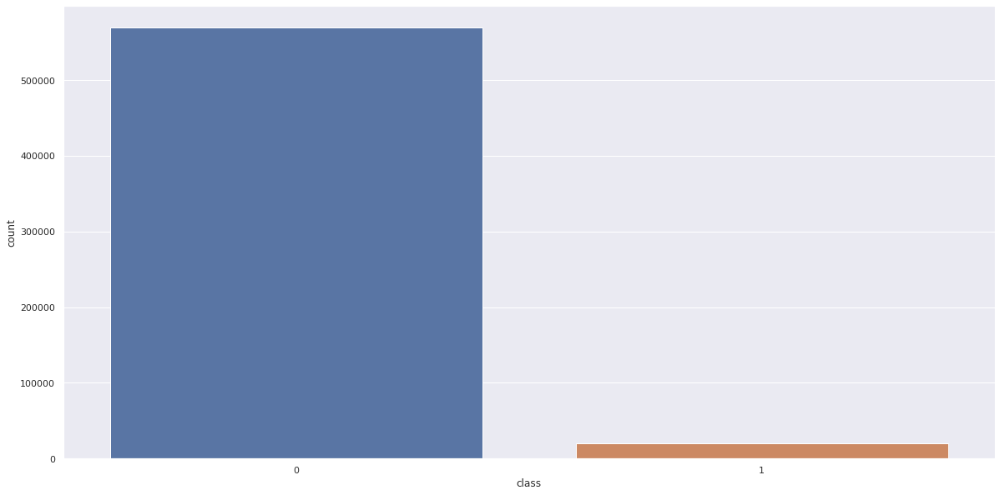

In [17]:
sns.set(rc={"figure.figsize":(20, 10)}) # set the figure size to make things look bigger.
sns.barplot(data=class_distrib, x="class", y="count")
# sns.countplot()

This dataset has a big imbalance issue. This will be an issue moving forward, we want to be careful about which metircs to use to evaluate our machine learning model 

In [18]:
pd.DataFrame(df.TransactionDT.value_counts().reset_index())

,index,TransactionDT
0,9474817,8
1,11576951,5
2,4397066,5
3,7236588,5
4,1544629,4
...,...,...
573344,4629634,1
573345,4629631,1
573346,4629557,1
573347,4629466,1


we do have a datetime column and we need to process it

In [19]:
from datetime import datetime, timedelta

In [20]:
# Date features

START_DATE         = '2017-12-01' 
# given that the start date is from this date forward. From above, the 8, 5, ..., 1 are 
startdate          = datetime.strptime(START_DATE, "%Y-%m-%d")
df["Date"]         = df['TransactionDT'].apply(lambda x: (startdate + timedelta(seconds=x)))
# adding time in seconds using the timedelta function inside another function we call lambda x: <expression>. 
# We then apply it to df.TransactionDT

# df.TransactionDT or df['TransactionDT']
# .apply() uses a function you define or stored in the library such as mean, min, max, to the column you specify

df['Weekdays']    = df['Date'].dt.dayofweek
df['Hours']       = df['Date'].dt.hour
df['Days']        = df['Date'].dt.day

In [21]:
df.Days.value_counts()

3     24197
4     23223
2     21894
23    21265
24    21026
21    20358
5     20200
6     20095
20    19914
22    19675
13    19625
17    19617
25    19606
26    19563
19    19089
10    19074
14    19049
16    18839
9     18788
15    18784
7     18742
1     18264
18    18158
8     18117
12    17989
27    17946
11    17879
28    17662
30    15361
29    13379
31    13162
Name: Days, dtype: int64

In [22]:
df.P_emaildomain.value_counts()

gmail.com           228355
yahoo.com           100934
hotmail.com          45250
anonymous.com        36998
aol.com              28289
comcast.net           7888
icloud.com            6267
outlook.com           5096
msn.com               4092
att.net               4033
live.com              3041
sbcglobal.net         2970
verizon.net           2705
ymail.com             2396
bellsouth.net         1909
yahoo.com.mx          1543
me.com                1522
cox.net               1393
optonline.net         1011
charter.net            816
live.com.mx            749
rocketmail.com         664
mail.com               559
earthlink.net          514
gmail                  496
outlook.es             438
mac.com                436
juno.com               322
aim.com                315
hotmail.es             305
roadrunner.com         305
windstream.net         305
hotmail.fr             295
frontier.com           280
embarqmail.com         260
web.de                 240
netzero.com            230
t

In [23]:
df.loc[df['P_emaildomain'].isin(['gmail.com', 'gmail']),'P_emaildomain'] = 'Google'

df.loc[df['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                         'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                         'yahoo.es']), 'P_emaildomain'] = 'Yahoo Mail'

df.loc[df['P_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 
                                         'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                         'outlook.es', 'live.com', 'live.fr',
                                         'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'

df.loc[df.P_emaildomain.isin(df.P_emaildomain\
                                         .value_counts()[df.P_emaildomain.value_counts() <= 500 ]\
                                         .index), 'P_emaildomain'] = "Others"
                                         
df.P_emaildomain.fillna("NoInf", inplace=True)

In [24]:
# Average fraud per transaction by Product CD

# groupby separates the data into different groups based on the value of that variable. (ex) variable called color. Within that, we have red, blue, green, yellow. THe groupby will make the data into 4 groups representing the 4 colors. 
df.groupby('ProductCD')['isFraud'].mean()

# 0 or 1. 

ProductCD
C    0.116873
H    0.047662
R    0.037826
S    0.058996
W    0.020399
Name: isFraud, dtype: float64

In [25]:
# Average fraud per transaction by email domain

df.groupby('P_emaildomain')['isFraud'].mean() # .max() or .median() or .min()

P_emaildomain
Google            0.043496
Microsoft         0.053298
NoInf             0.029538
Others            0.025646
Yahoo Mail        0.022544
anonymous.com     0.023217
aol.com           0.021811
att.net           0.007439
bellsouth.net     0.027763
charter.net       0.030637
comcast.net       0.031187
cox.net           0.020818
earthlink.net     0.021401
icloud.com        0.031434
mail.com          0.189624
me.com            0.017740
optonline.net     0.016815
rocketmail.com    0.003012
sbcglobal.net     0.004040
verizon.net       0.008133
ymail.com         0.020868
Name: isFraud, dtype: float64

## EDA (visualizations)

### Count plots (distribution)

In [26]:
def plot_cat_with_amt(df, col, lim=2000):
    tmp = pd.crosstab(df[col], df['isFraud'], normalize='index') * 100
    tmp = tmp.reset_index()
    tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)
    
    plt.figure(figsize=(16,14))    
    plt.suptitle(f'{col} Distributions ', fontsize=24)
    
    plt.subplot(211)
    g = sns.countplot( x=col,  data=df, order=list(tmp[col].values))

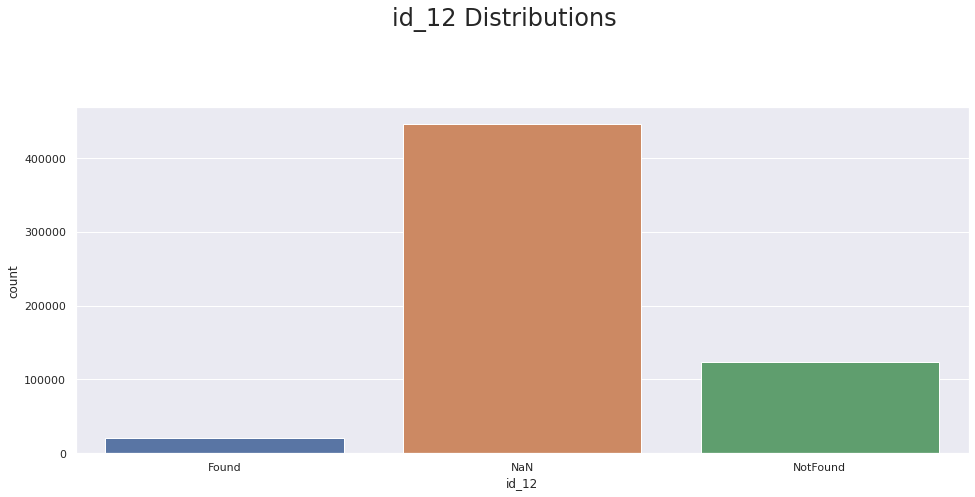

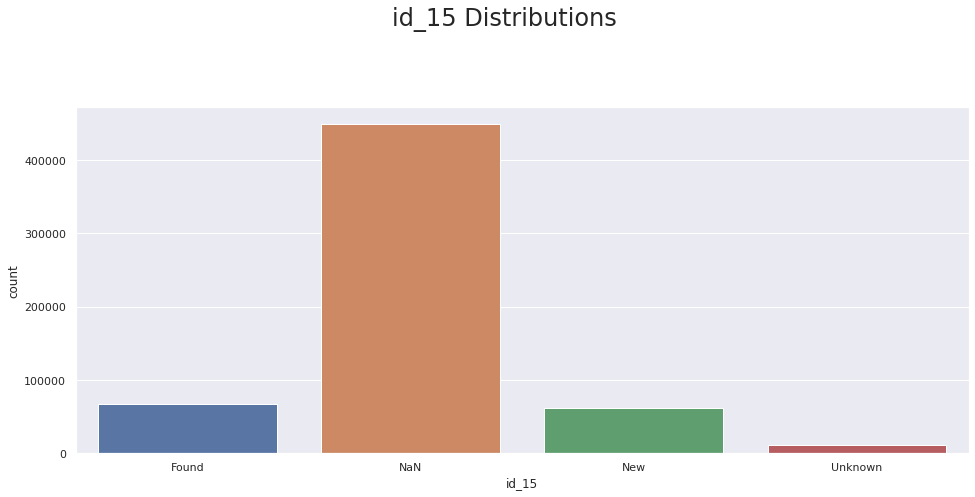

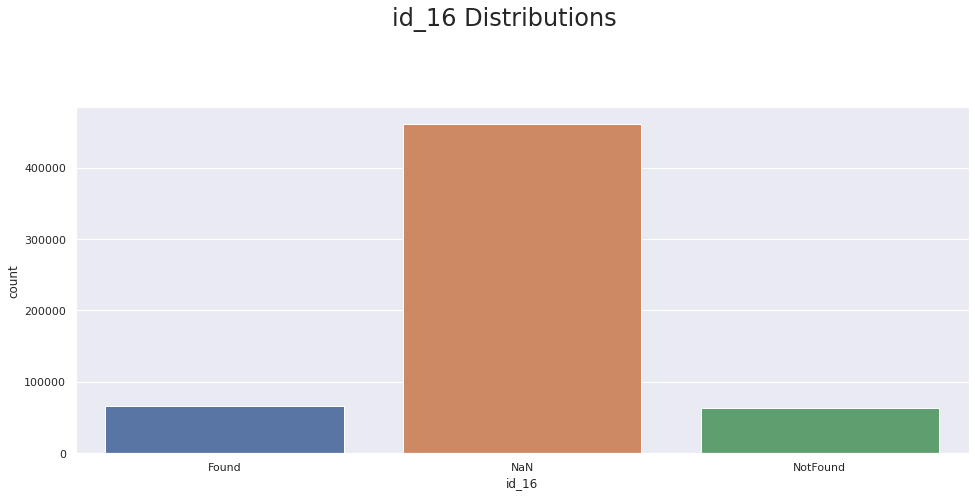

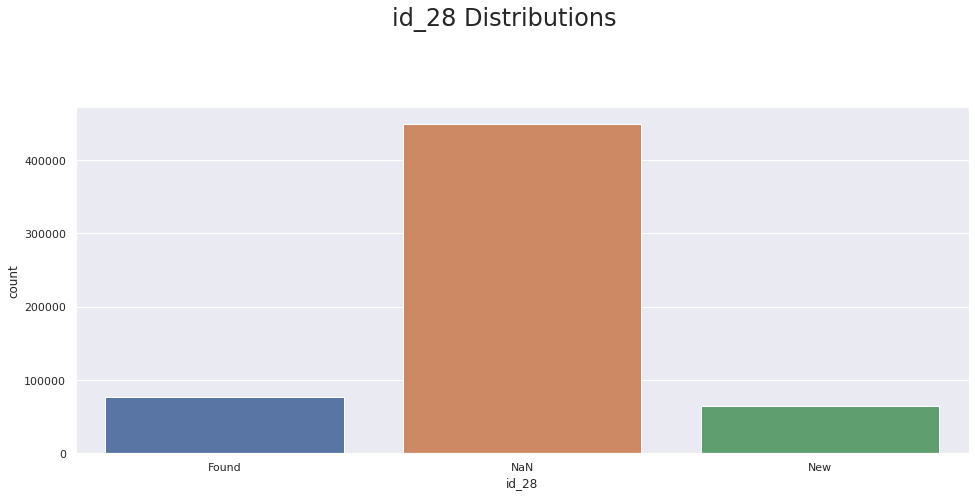

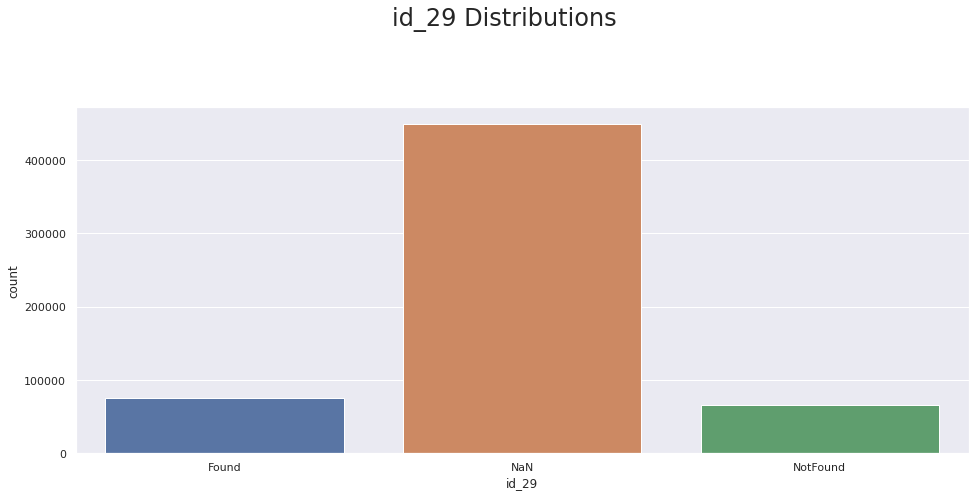

In [27]:
# be sure to remove the null values (empty) with NaN before you do visualizations. 
for col in ['id_12', 'id_15', 'id_16', 'id_28', 'id_29']:
    df[col] = df[col].fillna('NaN') # or do df[col].fillna('NaN', inplace=True)
    plot_cat_with_amt(df, col)

In [28]:
print(list(df.columns))

['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V

Do the same for the C, D, M, V-variables, ids, etc

### Distribution

Text(0, 0.5, 'Probability')

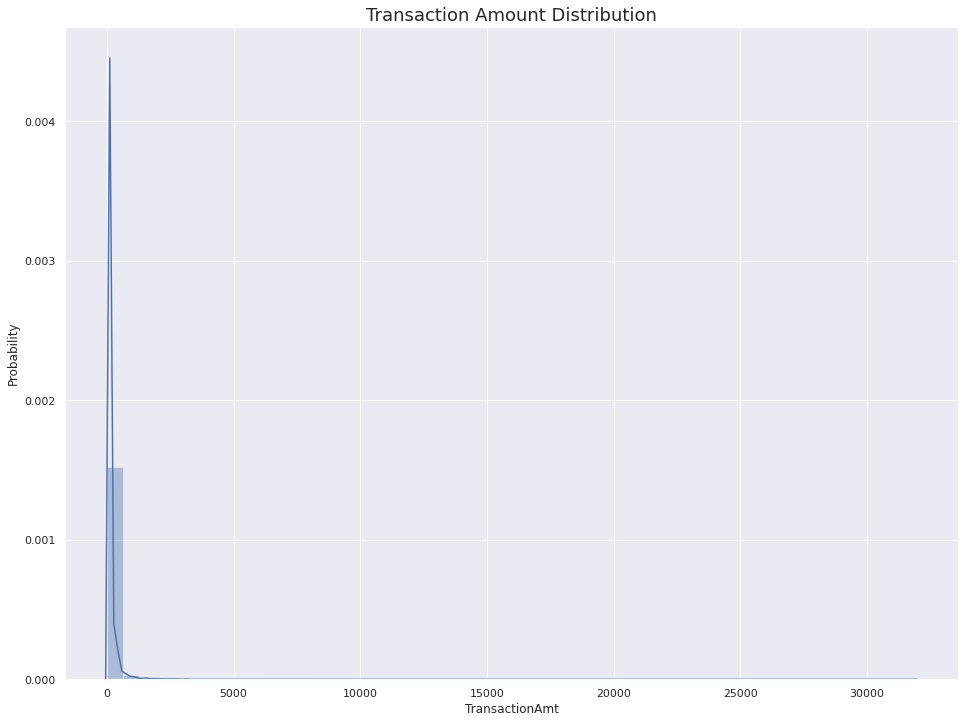

In [29]:
# Distribution plot of Transaction Amount
plt.figure(figsize=(16,12))

sns.distplot(df['TransactionAmt'])
plt.title("Transaction Amount Distribution", fontsize=18)
plt.ylabel("Probability")

Heavily skewed to the right: not anything close to a normal distribution at all

Let's narrow down further:
See the distribute of the lower values (restrict to a narrower range)

Text(0, 0.5, 'Probability')

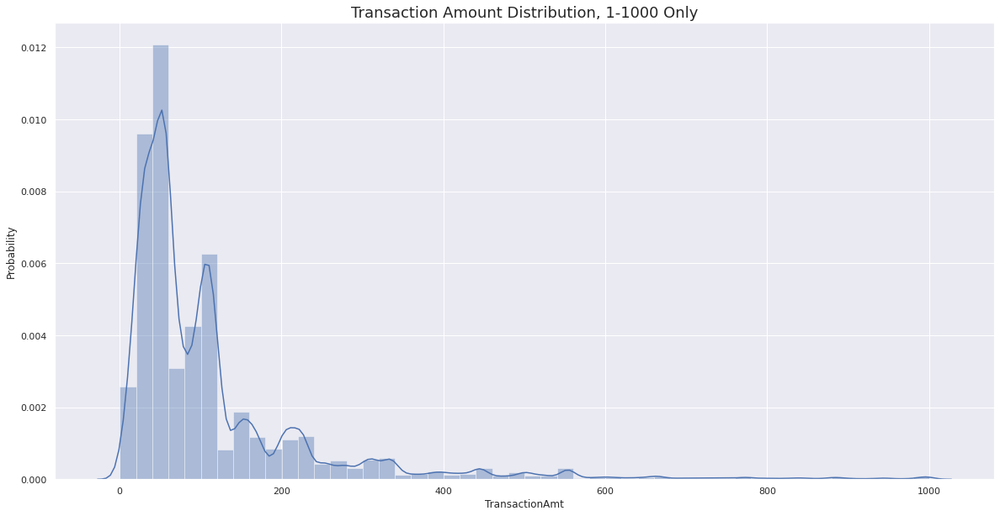

In [30]:
# sns.distplot(df['TransactionAmt'])
sns.set(rc={"figure.figsize":(20, 10)}) # set the figure size to make things look bigger.
sns.distplot(df[df['TransactionAmt'] <= 1000]['TransactionAmt']) # (([[]]))
plt.title("Transaction Amount Distribution, 1-1000 Only", fontsize=18)
plt.ylabel("Probability")

We can find the log of the TransactionAmt column to make it distribution appear more centered and more like normal distribution. Could also try np.sqrt()

Some models are very sensitive to distribution of data. 

Text(0, 0.5, 'Probability')

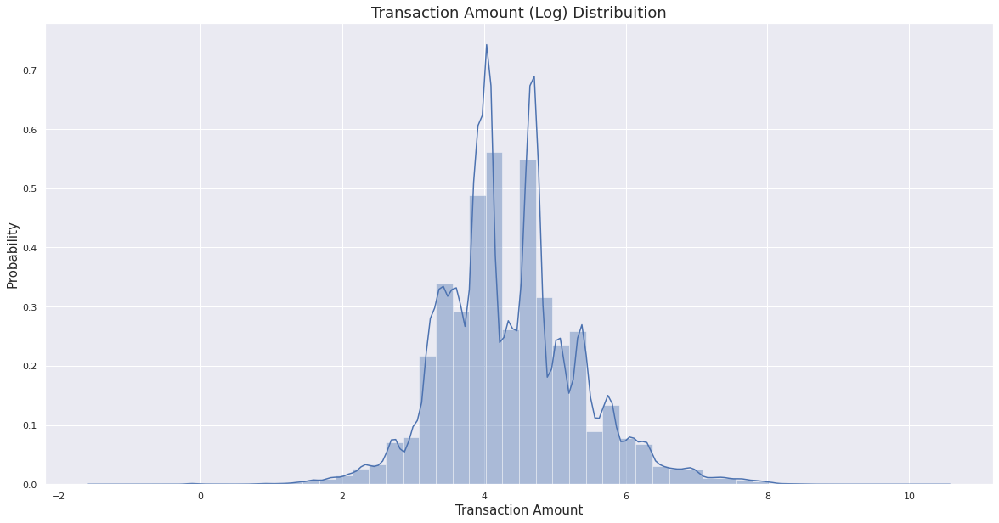

In [31]:
sns.distplot(np.log(df['TransactionAmt']))
plt.title("Transaction Amount (Log) Distribuition", fontsize=18)
plt.xlabel("Transaction Amount", fontsize=15)
plt.ylabel("Probability", fontsize=15)

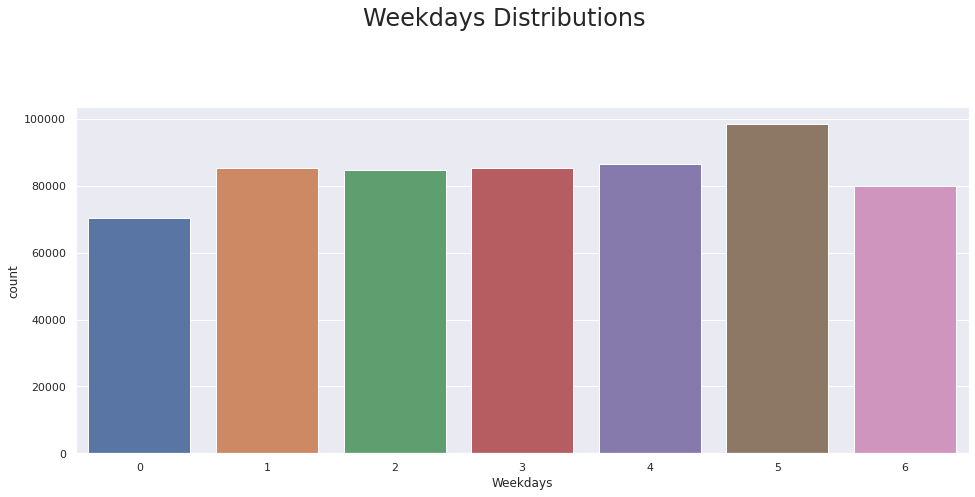

In [32]:
plot_cat_with_amt(df, 'Weekdays')

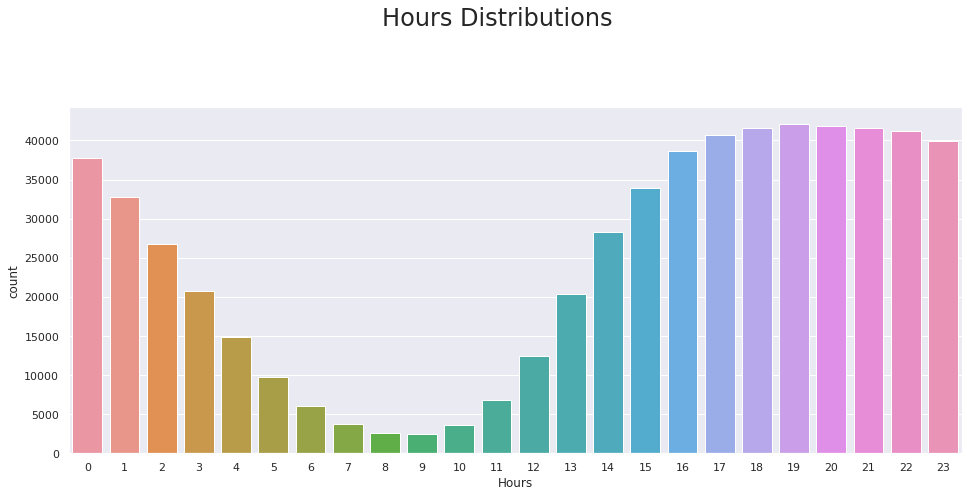

In [33]:
plot_cat_with_amt(df, 'Hours')

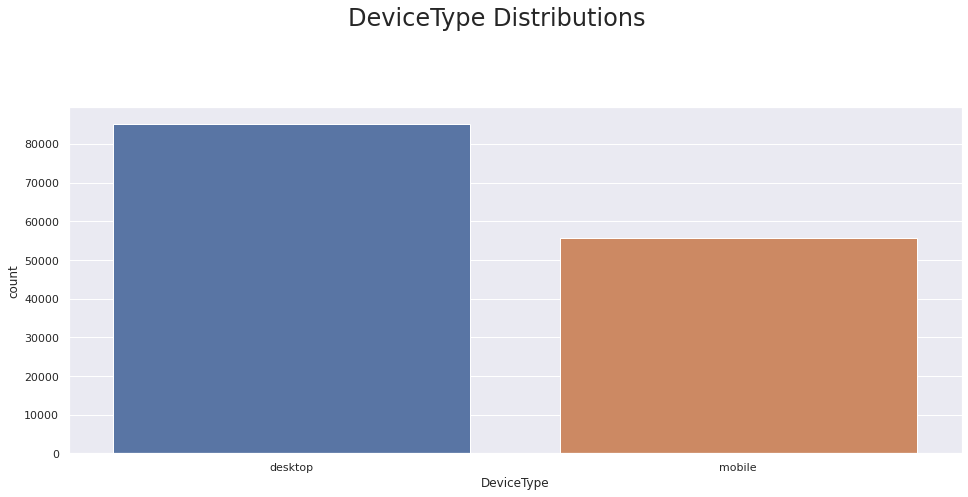

In [34]:
plot_cat_with_amt(df, 'DeviceType')

# Reminder:
1. create a new col to np.log()

In [35]:
pd.crosstab(df[col], df['isFraud'], normalize='index')

id29_table = df.groupby(["id_29"])["isFraud"].value_counts()
id29 = pd.DataFrame(id29_table)
id29

isFraud
id_29    isFraud         
Found    0          67099
         1           7827
NaN      0         440117
         1           9445
NotFound 0          62661
         1           3391

In [36]:
def plot_cat_feat_dist(df, col):
    tmp = pd.crosstab(df[col], df['isFraud'], normalize='index') * 100
    tmp = tmp.reset_index()
    tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)

    plt.figure(figsize=(25, 18))
    plt.suptitle(f'{col} Distributions', fontsize=22)

    plt.subplot(221)
    g = sns.countplot(x=col, data=df, order=tmp[col].values)

    g.set_title(f"{col} Distribution", fontsize=16)
    g.set_xlabel(f"{col} Name", fontsize=17)
    g.set_ylabel("Count", fontsize=17)
        
    plt.subplot(222)
    g1 = sns.countplot(x=col, hue='isFraud', data=df, order=tmp[col].values)
    plt.legend(title='Fraud', loc='best', labels=['No', 'Yes'])

    g1.set_title(f"{col} Distribution by Target Variable (isFraud) ", fontsize=16)
    g1.set_xlabel(f"{col} Name", fontsize=17)
    g1.set_ylabel("Count", fontsize=17)

    plt.subplots_adjust(hspace = 0.4, top = 0.85)

    plt.show()

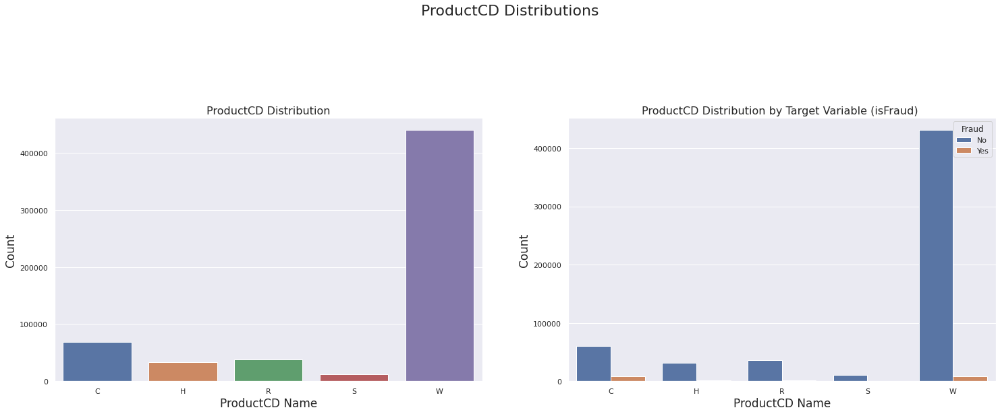

In [37]:
plot_cat_feat_dist(df, "ProductCD")

In [38]:
# Average fraud per transaction by ProductCD
df.groupby('ProductCD')['isFraud'].mean()

ProductCD
C    0.116873
H    0.047662
R    0.037826
S    0.058996
W    0.020399
Name: isFraud, dtype: float64

Some findings so far:

1. Fraud rate is highest for Product C and lowest (on average) for Product W

2. More transctions happen on Saturday than weekdays (which are more or less similar) except a low on Monday

3. As for ProductCD, A significantly high number of W's than everything else

In [39]:
list(df.columns)

['TransactionID',
 'isFraud',
 'TransactionDT',
 'TransactionAmt',
 'ProductCD',
 'card1',
 'card2',
 'card3',
 'card4',
 'card5',
 'card6',
 'addr1',
 'addr2',
 'dist1',
 'dist2',
 'P_emaildomain',
 'R_emaildomain',
 'C1',
 'C2',
 'C3',
 'C4',
 'C5',
 'C6',
 'C7',
 'C8',
 'C9',
 'C10',
 'C11',
 'C12',
 'C13',
 'C14',
 'D1',
 'D2',
 'D3',
 'D4',
 'D5',
 'D6',
 'D7',
 'D8',
 'D9',
 'D10',
 'D11',
 'D12',
 'D13',
 'D14',
 'D15',
 'M1',
 'M2',
 'M3',
 'M4',
 'M5',
 'M6',
 'M7',
 'M8',
 'M9',
 'V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'V29',
 'V30',
 'V31',
 'V32',
 'V33',
 'V34',
 'V35',
 'V36',
 'V37',
 'V38',
 'V39',
 'V40',
 'V41',
 'V42',
 'V43',
 'V44',
 'V45',
 'V46',
 'V47',
 'V48',
 'V49',
 'V50',
 'V51',
 'V52',
 'V53',
 'V54',
 'V55',
 'V56',
 'V57',
 'V58',
 'V59',
 'V60',
 'V61',
 'V62',
 'V63',
 'V64',
 'V

### Card Features

In [40]:
df.groupby(["card4"])["isFraud"].mean()

card4
american express    0.028698
discover            0.077282
mastercard          0.034331
visa                0.034756
Name: isFraud, dtype: float64



df['col2'] = stats.zscore(df['col2'])

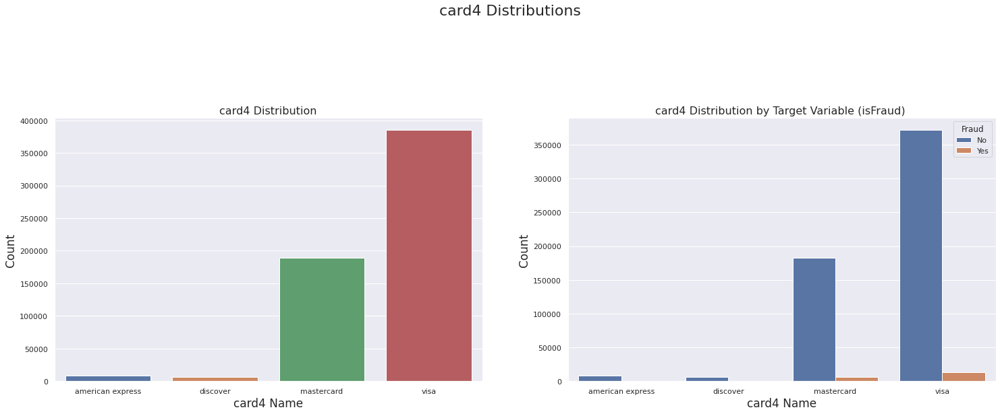

In [41]:
plot_cat_feat_dist(df, "card4")

More cases for the Visa and Mastercard, but this could also be a matter of them having more card counts

In [42]:
df.groupby(["card4"])["isFraud"].mean()

card4
american express    0.028698
discover            0.077282
mastercard          0.034331
visa                0.034756
Name: isFraud, dtype: float64

Higher chance if you have the "discover" card for fruadulous cases. Mastercard and Visa do take more share of fraudulant cases but their percentages are both lower than "discover" cards.

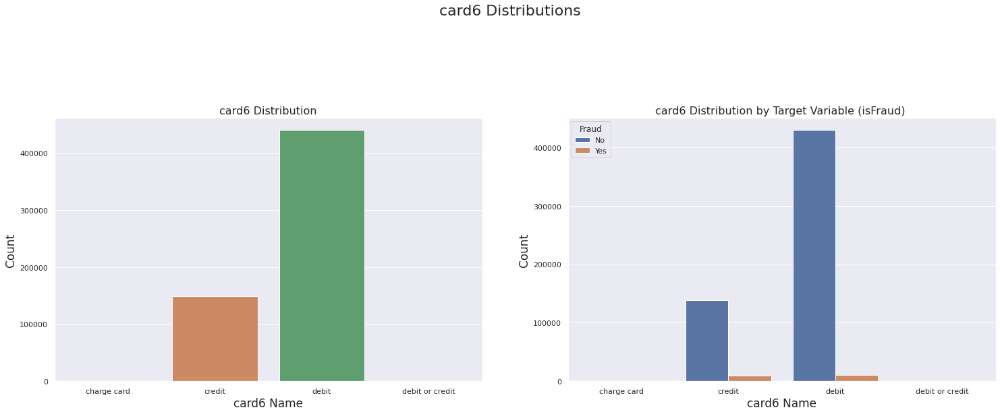

In [43]:
plot_cat_feat_dist(df, "card6")

In [44]:
# Average fraud per transaction by Card6
df.groupby('P_emaildomain')['isFraud'].mean()

P_emaildomain
Google            0.043496
Microsoft         0.053298
NoInf             0.029538
Others            0.025646
Yahoo Mail        0.022544
anonymous.com     0.023217
aol.com           0.021811
att.net           0.007439
bellsouth.net     0.027763
charter.net       0.030637
comcast.net       0.031187
cox.net           0.020818
earthlink.net     0.021401
icloud.com        0.031434
mail.com          0.189624
me.com            0.017740
optonline.net     0.016815
rocketmail.com    0.003012
sbcglobal.net     0.004040
verizon.net       0.008133
ymail.com         0.020868
Name: isFraud, dtype: float64

In [45]:
df.columns.to_list()

['TransactionID',
 'isFraud',
 'TransactionDT',
 'TransactionAmt',
 'ProductCD',
 'card1',
 'card2',
 'card3',
 'card4',
 'card5',
 'card6',
 'addr1',
 'addr2',
 'dist1',
 'dist2',
 'P_emaildomain',
 'R_emaildomain',
 'C1',
 'C2',
 'C3',
 'C4',
 'C5',
 'C6',
 'C7',
 'C8',
 'C9',
 'C10',
 'C11',
 'C12',
 'C13',
 'C14',
 'D1',
 'D2',
 'D3',
 'D4',
 'D5',
 'D6',
 'D7',
 'D8',
 'D9',
 'D10',
 'D11',
 'D12',
 'D13',
 'D14',
 'D15',
 'M1',
 'M2',
 'M3',
 'M4',
 'M5',
 'M6',
 'M7',
 'M8',
 'M9',
 'V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'V29',
 'V30',
 'V31',
 'V32',
 'V33',
 'V34',
 'V35',
 'V36',
 'V37',
 'V38',
 'V39',
 'V40',
 'V41',
 'V42',
 'V43',
 'V44',
 'V45',
 'V46',
 'V47',
 'V48',
 'V49',
 'V50',
 'V51',
 'V52',
 'V53',
 'V54',
 'V55',
 'V56',
 'V57',
 'V58',
 'V59',
 'V60',
 'V61',
 'V62',
 'V63',
 'V64',
 'V

### Email Domain

In [46]:
df.loc[df['R_emaildomain'].isin(['gmail.com', 'gmail']),'R_emaildomain'] = 'Google'

df.loc[df['R_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                             'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                             'yahoo.es']), 'R_emaildomain'] = 'Yahoo Mail'
df.loc[df['R_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 
                                             'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                             'outlook.es', 'live.com', 'live.fr',
                                             'hotmail.fr']), 'R_emaildomain'] = 'Microsoft'
df.loc[df.R_emaildomain.isin(df.R_emaildomain\
                                         .value_counts()[df.R_emaildomain.value_counts() <= 300 ]\
                                         .index), 'R_emaildomain'] = "Others"
df.R_emaildomain.fillna("NoInf", inplace=True)

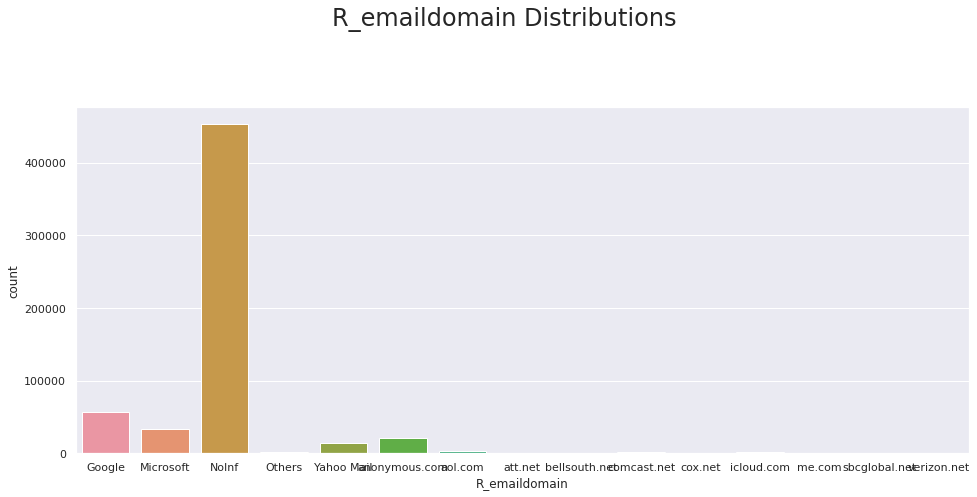

In [47]:
plot_cat_with_amt(df, 'R_emaildomain')

#### Introducing Plotly 

(my personal favorite: very intuitive interface, easy to pick up; plot without big learning curve)

In [48]:
#!pip install --upgrade plotly

In [49]:
#!pip install --upgrade jupyter-dash

In [50]:
import plotly.express as px

In [51]:
"""
fig = px.histogram(df, x='R_emaildomain', text_auto='.2s',
            title="R_emaildomain")
fig.show()
"""

'\nfig = px.histogram(df, x=\'R_emaildomain\', text_auto=\'.2s\',\n            title="R_emaildomain")\nfig.show()\n'

In [52]:
df.groupby('R_emaildomain')['isFraud'].mean()

R_emaildomain
Google           0.118986
Microsoft        0.080764
NoInf            0.020819
Others           0.050989
Yahoo Mail       0.046235
anonymous.com    0.029130
aol.com          0.034855
att.net          0.000000
bellsouth.net    0.004739
comcast.net      0.011589
cox.net          0.023965
icloud.com       0.128755
me.com           0.019784
sbcglobal.net    0.001812
verizon.net      0.000000
Name: isFraud, dtype: float64

Google and Microsoft and icloud have the largest amount of fraudulous percentage 

P-email Domain

In [53]:
df.loc[df['P_emaildomain'].isin(['gmail.com', 'gmail']),'P_emaildomain'] = 'Google'

df.loc[df['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                         'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                         'yahoo.es']), 'P_emaildomain'] = 'Yahoo Mail'
df.loc[df['P_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 
                                         'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                         'outlook.es', 'live.com', 'live.fr',
                                         'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'
df.loc[df.P_emaildomain.isin(df.P_emaildomain\
                                         .value_counts()[df.P_emaildomain.value_counts() <= 500 ]\
                                         .index), 'P_emaildomain'] = "Others"
df.P_emaildomain.fillna("NoInf", inplace=True)

In [54]:
fig = px.histogram(df, x='P_emaildomain', text_auto='.2s',
            title="P_emaildomain")
fig.show()

In [55]:
df.groupby(['isFraud', "P_emaildomain"])['TransactionAmt'].sum()

isFraud  P_emaildomain 
0        Google                inf
         Microsoft             inf
         NoInf                 inf
         Others                inf
         Yahoo Mail            inf
         anonymous.com         inf
         aol.com               inf
         att.net               inf
         bellsouth.net         inf
         charter.net           inf
         comcast.net           inf
         cox.net               inf
         earthlink.net         inf
         icloud.com            inf
         mail.com          55136.0
         me.com                inf
         optonline.net         inf
         rocketmail.com        inf
         sbcglobal.net         inf
         verizon.net           inf
         ymail.com             inf
1        Google                inf
         Microsoft             inf
         NoInf                 inf
         Others            21072.0
         Yahoo Mail            inf
         anonymous.com         inf
         aol.com               

In [56]:
# write down your own visualization code to see different aspects of the data

Making a plot of the count of 1s and 0s of is Fraud to see the density of what proprotion is fraud and not fraud


<AxesSubplot:xlabel='isFraud', ylabel='Density'>

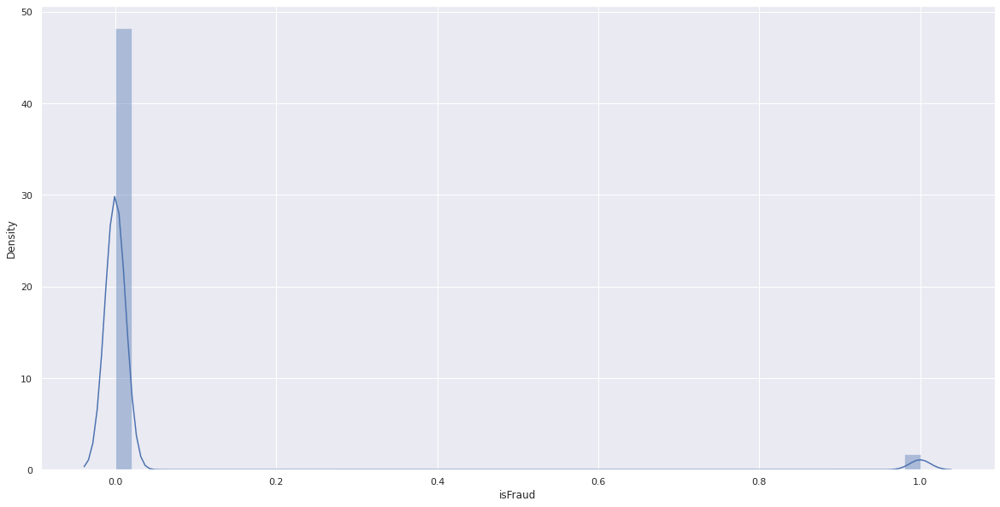

In [57]:
sns.distplot(df['isFraud'])

Making a distribution plot of the count of the ProductCDs


<AxesSubplot:xlabel='ProductCD', ylabel='Count'>

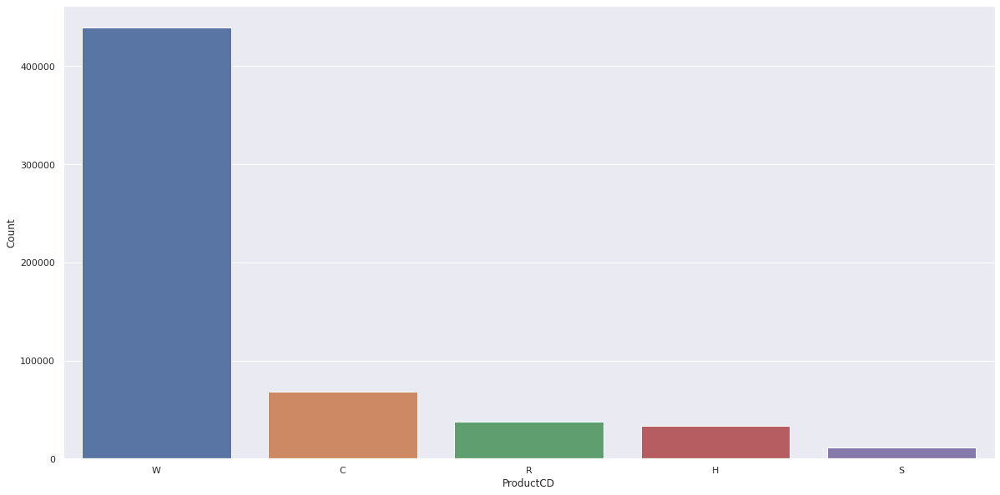

In [58]:
distrib = pd.DataFrame(df.ProductCD.value_counts().reset_index())
distrib.columns = ['ProductCD',"Count"]
sns.barplot(data=distrib, x="ProductCD", y="Count")

Shows the mean transaction amount for credit card fraud and non credit card fraud

<AxesSubplot:xlabel='isFraud'>

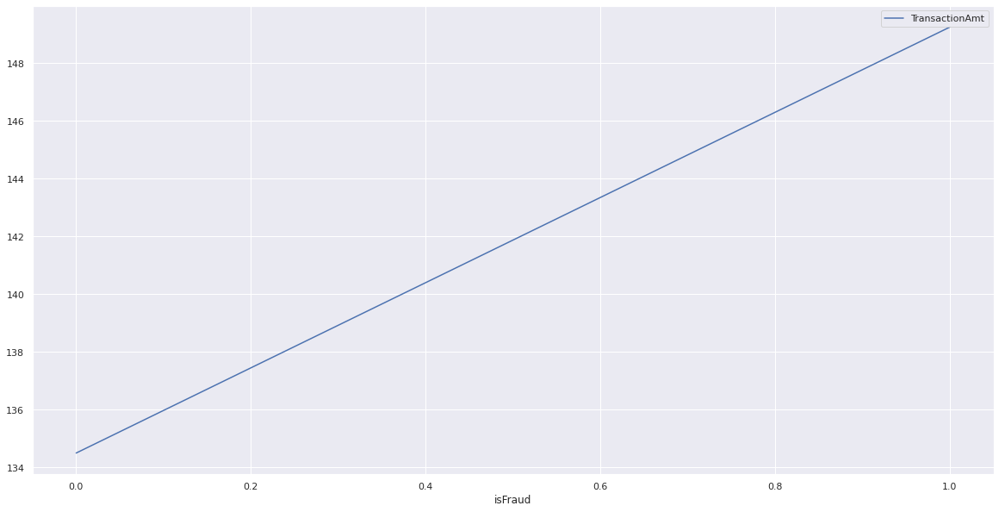

In [59]:
df.groupby('isFraud')['TransactionAmt'].mean().plot(legend=True)

Shows the count of the different emails for the varaible P_emaildomain


In [60]:
fig = px.histogram(df, x='P_emaildomain', text_auto='.2s',
            title="P_emaildomain")
fig.show()

Plotting the Device Type and its relation to whether or not there was crdit card frud

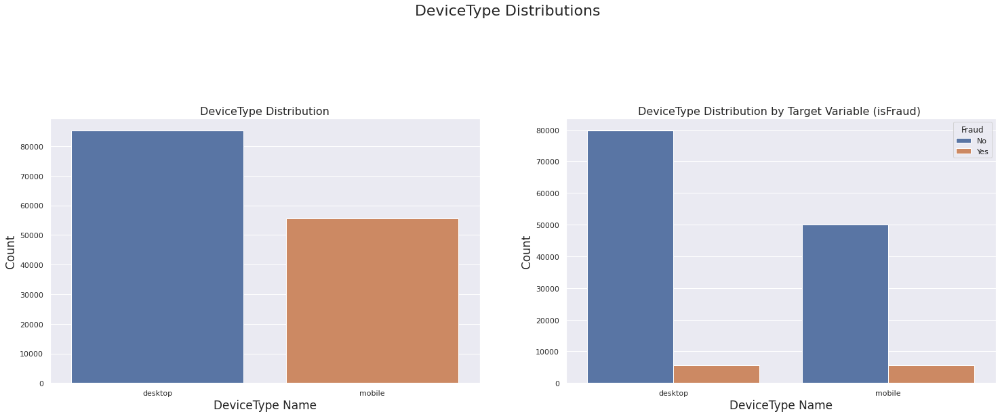

In [61]:
plot_cat_feat_dist(df, "DeviceType")

1. numeric: scatterplot, regression (lm) if you do the ggplot, boxplot, violinplot, heatmaps (correlation)
2. categorical: (sns) distplot (countplot), barplot (useful to take average first or sth)

SNS and / or PLOTLY

In [62]:
"""
from scipy import stats
  
  
# Creating the data frame
details = {
    'col1': [1, 3, 5, 7, 9],
    'col2': [7, 4, 35, 14, 56]
}
  
# creating a Dataframe object
df = pd.DataFrame(details)

# Z-Score using scipy
df['col2'] = stats.zscore(df['col2'])
"""

"\nfrom scipy import stats\n  \n  \n# Creating the data frame\ndetails = {\n    'col1': [1, 3, 5, 7, 9],\n    'col2': [7, 4, 35, 14, 56]\n}\n  \n# creating a Dataframe object\ndf = pd.DataFrame(details)\n\n# Z-Score using scipy\ndf['col2'] = stats.zscore(df['col2'])\n"

In [63]:
# transaction amt / group by card 1, [transaction amt] .transform(mean)
# transaction amt / group by card 4, [transaction amt] .transform(mean)
# transaction amt / group by card 1, [transaction amt] .transform(std)
# transaction amt / group by card 4, [transaction amt] .transform(std)


In [64]:
df.Hours.mean()

13.861922985741863

Fill N/As (in the data columns it would just be empty values or blank) for id columns:

1. Find the ID columns
2. fillna with mean or median. You decide. Why?
3. Some other ways to fill the na for numeric data?



# ID

In [65]:
for col in ['id_12', 'id_15', 'id_16', 'id_28', 'id_29']:
    df[col] = df[col].fillna('NaN')

df.loc[df['id_30'].str.contains('Windows', na=False), 'id_30'] = 'Windows'
df.loc[df['id_30'].str.contains('iOS', na=False), 'id_30'] = 'iOS'
df.loc[df['id_30'].str.contains('Mac OS', na=False), 'id_30'] = 'Mac'
df.loc[df['id_30'].str.contains('Android', na=False), 'id_30'] = 'Android'
df['id_30'].fillna("NAN", inplace=True)

In [66]:
df.loc[df['id_31'].str.contains('chrome', na=False), 'id_31'] = 'Chrome'
df.loc[df['id_31'].str.contains('firefox', na=False), 'id_31'] = 'Firefox'
df.loc[df['id_31'].str.contains('safari', na=False), 'id_31'] = 'Safari'
df.loc[df['id_31'].str.contains('edge', na=False), 'id_31'] = 'Edge'
df.loc[df['id_31'].str.contains('ie', na=False), 'id_31'] = 'IE'
df.loc[df['id_31'].str.contains('samsung', na=False), 'id_31'] = 'Samsung'
df.loc[df['id_31'].str.contains('opera', na=False), 'id_31'] = 'Opera'

https://pandas.pydata.org/docs/reference/api/pandas.Series.str.contains.html

In [67]:
df['id_31'].str

df.loc[ [T F T T F ...], column_name ] = some_value

In [68]:
df['id_31'].str.contains('ie', na=False)

0         False
1         False
2         False
3         False
4         False
          ...  
590535    False
590536    False
590537    False
590538    False
590539    False
Name: id_31, Length: 590540, dtype: bool

In [69]:
df.id_31.value_counts() < 200

Chrome                            False
Safari                            False
IE                                False
Firefox                           False
Edge                              False
Samsung                           False
Opera                             False
other                             False
Samsung/SM-G532M                   True
android browser 4.0                True
Generic/Android 7.0                True
Generic/Android                    True
google search application 49.0     True
google search application 48.0     True
Samsung/SM-G531H                   True
google                             True
Microsoft/Windows                  True
silk                               True
mobile                             True
ZTE/Blade                          True
comodo                             True
maxthon                            True
line                               True
aol                                True
icedragon                          True


In [70]:
df.id_31.value_counts()[df.id_31.value_counts() < 200]

Samsung/SM-G532M                  150
android browser 4.0               100
Generic/Android 7.0                81
Generic/Android                    57
google search application 49.0     55
google search application 48.0     55
Samsung/SM-G531H                   52
google                             36
Microsoft/Windows                  25
silk                               19
mobile                             11
ZTE/Blade                           9
comodo                              6
maxthon                             6
line                                6
aol                                 5
icedragon                           5
Mozilla/Firefox                     5
Lanix/Ilium                         3
puffin                              2
waterfox                            2
facebook                            2
palemoon                            2
M4Tel/M4                            1
seamonkey                           1
BLU/Dash                            1
chromium    

In [71]:
df.id_31.value_counts()[df.id_31.value_counts() < 200].index

Index(['Samsung/SM-G532M', 'android browser 4.0', 'Generic/Android 7.0',
       'Generic/Android', 'google search application 49.0',
       'google search application 48.0', 'Samsung/SM-G531H', 'google',
       'Microsoft/Windows', 'silk', 'mobile', 'ZTE/Blade', 'comodo', 'maxthon',
       'line', 'aol', 'icedragon', 'Mozilla/Firefox', 'Lanix/Ilium', 'puffin',
       'waterfox', 'facebook', 'palemoon', 'M4Tel/M4', 'seamonkey', 'BLU/Dash',
       'chromium', 'Inco/Minion', 'iron', 'Cherry', 'LG/K-200', 'android',
       'Samsung/SCH', 'Nokia/Lumia', 'cyberfox'],
      dtype='object')

In [72]:
df.id_31.isin(df.id_31.value_counts()[df.id_31.value_counts() < 200].index)

0         False
1         False
2         False
3         False
4         False
          ...  
590535    False
590536    False
590537    False
590538    False
590539    False
Name: id_31, Length: 590540, dtype: bool

In [73]:
df.loc[df.id_31.isin(df.id_31.value_counts()[df.id_31.value_counts() < 200].index), 'id_31'] = "Others"

df['id_31'].fillna("NAN", inplace=True)

In [74]:
from scipy import stats
  
  
# Creating the data frame
details = {
    'col1': [1, 3, 5, 7, 9],
    'col2': [7, 4, 35, 14, 56]
}
  
# creating a Dataframe object
demo = pd.DataFrame(details)
  
# Z-Score using scipy
demo['col2'] = stats.zscore(demo['col2'])

In [75]:
demo

,col1,col2
0,1,-0.824387
1,3,-0.977052
2,5,0.600480
3,7,-0.468171
4,9,1.669130


### Significance Tests

Chi-Squared Test

Chi-Square test tells if the entire variable is useful or not.

First let's separate columns by their types:
1. cat_columns
2. binary_columns
3. num_columns

In [76]:
cat_columns = df.select_dtypes(include=['object']).columns
len(cat_columns)

binary_columns = [col for col in df.columns if df[col].nunique() == 2]
len(binary_columns)

num_columns = [col for col in df.columns if (col not in cat_columns) & (col not in binary_columns)]
len(num_columns)

399

In [77]:
print(f"Number of columns \n\ncategorical: {len(cat_columns)}\nbinary: {len(binary_columns)} \nnumerical: {len(num_columns)}")

Number of columns 

categorical: 31
binary: 22 
numerical: 399


Import Library

In [78]:
from scipy.stats import chi2_contingency

In [79]:
# See the odds (the ratio of the 1 class to the 0 class) 
ctab = pd.crosstab(df['ProductCD'], df['isFraud'].astype('category')) # nothing but a few 
ctab

isFraud,0,1
ProductCD,,
C,60511,8008
H,31450,1574
R,36273,1426
S,10942,686
W,430701,8969


In [80]:
cat_columns = cat_columns.to_list() + binary_columns

Chi_squared tests have to do with categorical columns (variables) to see if the observed values for the groups within that column are any different from the expected.

In [81]:
# significance value
alpha = 0.05

significant_categorical_variables = []

for col in cat_columns:  
    # Create a crosstab table
    temp = pd.crosstab(df[col], df['isFraud'].astype('category'))
    
    # Get chi-square value , p-value, degrees of freedom, expected frequencies using the function chi2_contingency
    stat, p, dof, expected = chi2_contingency(temp)
    
    # Determine whether to reject or keep your null hypothesis
    print(col.ljust(40), ',  chisquared=%.5f,   p-value=%.5f' % (stat, p))
    if p <= alpha:
        significant_categorical_variables.append(col)
    else:
        continue

ProductCD                                ,  chisquared=16742.17153,   p-value=0.00000
card4                                    ,  chisquared=364.87414,   p-value=0.00000
card6                                    ,  chisquared=5957.03229,   p-value=0.00000
P_emaildomain                            ,  chisquared=2652.43233,   p-value=0.00000
R_emaildomain                            ,  chisquared=17297.50859,   p-value=0.00000
M1                                       ,  chisquared=0.00000,   p-value=1.00000
M2                                       ,  chisquared=438.61321,   p-value=0.00000
M3                                       ,  chisquared=477.66057,   p-value=0.00000
M4                                       ,  chisquared=6450.44798,   p-value=0.00000
M5                                       ,  chisquared=242.42169,   p-value=0.00000
M6                                       ,  chisquared=227.96414,   p-value=0.00000
M7                                       ,  chisquared=11.25610,   p-va

In [82]:
ctab.columns = ctab.columns.add_categories('odds')
ctab['odds'] = ctab[1]/ctab[0]
ctab

isFraud,0,1,odds
ProductCD,,,
C,60511,8008,0.132340
H,31450,1574,0.050048
R,36273,1426,0.039313
S,10942,686,0.062694
W,430701,8969,0.020824


Odds ratio simply means dividing the odds by 

In [83]:
ctab.columns = ctab.columns.add_categories('odds_ratio')
ctab['odds_ratio'] = ctab['odds'] / (ctab[1].sum()/ctab[0].sum())
ctab

isFraud,0,1,odds,odds_ratio
ProductCD,,,,
C,60511,8008,0.132340,3.649871
H,31450,1574,0.050048,1.380295
R,36273,1426,0.039313,1.084236
S,10942,686,0.062694,1.729080
W,430701,8969,0.020824,0.574323


Highers odds ratio implies more chance of fraud in that category.

Farther away it is from 1.0 (both directions) more important the variable is.

### ANOVA test 

ANOVA test is a test of variance. However, the test statistic is actually the sample mean. 

First we need to understand what is it we are dealing with (we can't do any testing or technique without knowing WHAT we are working with in the first place. Sometimes, Statistics contains many terms that you kind of understand. 

But no, this is not the best approach. We need to know exactly what we are working with:
1. mean is a number (take the average of a bunch of numbers)
2. variance is similar to a range (measures spread; how spread out is the data) 

This is counterintuitive yet it is true in this case. We are determining if the variance between different groups (within the column / variable of interest) is statisically significant by comparing the sample means, not variance itself. 

Assumptions:

1. Samples are independent.

2. Each sample is from a normally distributed population.

3. The population standard deviations of the groups are all equal. This property is called homoscedasticity.


ANOVA deals with numerical variables / columns whereas CHi-squared tests deal with categorical

In [84]:
num_columns

['TransactionID',
 'TransactionDT',
 'TransactionAmt',
 'card1',
 'card2',
 'card3',
 'card5',
 'addr1',
 'addr2',
 'dist1',
 'dist2',
 'C1',
 'C2',
 'C3',
 'C4',
 'C5',
 'C6',
 'C7',
 'C8',
 'C9',
 'C10',
 'C11',
 'C12',
 'C13',
 'C14',
 'D1',
 'D2',
 'D3',
 'D4',
 'D5',
 'D6',
 'D7',
 'D8',
 'D9',
 'D10',
 'D11',
 'D12',
 'D13',
 'D14',
 'D15',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'V29',
 'V30',
 'V31',
 'V32',
 'V33',
 'V34',
 'V35',
 'V36',
 'V37',
 'V38',
 'V39',
 'V40',
 'V42',
 'V43',
 'V44',
 'V45',
 'V46',
 'V47',
 'V48',
 'V49',
 'V50',
 'V51',
 'V52',
 'V53',
 'V54',
 'V55',
 'V56',
 'V57',
 'V58',
 'V59',
 'V60',
 'V61',
 'V62',
 'V63',
 'V64',
 'V66',
 'V67',
 'V68',
 'V69',
 'V70',
 'V71',
 'V72',
 'V73',
 'V74',
 'V75',
 'V76',
 'V77',
 'V78',
 'V79',
 'V80',
 'V81',
 'V82',
 'V83',
 'V84',
 'V85',
 'V86',
 'V

### Your turn to code the ANOVA test:

1. follow the general directions listed below

2. refer back to the chi-squared test implementation

3. when in doubt, break code down and google things you don't know

In [85]:
# import library f_oneway from scipy.stats
from scipy.stats import f_oneway
# set significance value
sig_val = 0.05
# set a list variable (for storing items later)
significant_numerical_variables = []
# for loop (hint: only numerical columns) 
for col in num_columns:
    # if number of unique values for this column exceeds 50 (or some other number you choose)
    if df[col].nunique() > 50: 
      # use f_oneway function. Don't forget to dropna for the 2 inputs (the df with isfraud==1 and isfraud==0). What 2 outputs does f_oneway return? 
      # Name those 2 outputs using some reasonable names
      F, p = f_oneway(df[df.isFraud == 1][col].dropna(), 
                      df[df.isFraud == 0][col].dropna())
      # print them out. Also be sure to print out the column name. 
      print(col.ljust(40), ',   F-statistic=%.5f, p=%.5f' % (F, p), df.loc[:, col].nunique())
      # if <some_condition> (hint: has to do with p-value vs significance value):
      if p <= sig_val:
        significant_numerical_variables.append(col)
          # append the column into the list variable above


TransactionID                            ,   F-statistic=118.52652, p=0.00000 590540
TransactionDT                            ,   F-statistic=101.40691, p=0.00000 573349
TransactionAmt                           ,   F-statistic=75.67718, p=0.00000 8195
card1                                    ,   F-statistic=109.88932, p=0.00000 13553
card2                                    ,   F-statistic=6.67558, p=0.00977 500
card3                                    ,   F-statistic=14336.21578, p=0.00000 114
card5                                    ,   F-statistic=661.82659, p=0.00000 119
addr1                                    ,   F-statistic=16.43435, p=0.00005 332
addr2                                    ,   F-statistic=485.06660, p=0.00000 74
dist1                                    ,   F-statistic=110.42966, p=0.00000 2412
dist2                                    ,   F-statistic=13.66508, p=0.00022 1699
C1                                       ,   F-statistic=552.37693, p=0.00000 1495
C2      

Interpret the results

For the numerical columns with unique values above 50, the ones with a p-value higher than .05 are significant which is why we add them to the significant_numerical_variables category this means that their means between the groups are around the same

In [86]:
df.card5.nunique()

119

In [87]:
print(significant_numerical_variables)

['TransactionID', 'TransactionDT', 'TransactionAmt', 'card1', 'card2', 'card3', 'card5', 'addr1', 'addr2', 'dist1', 'dist2', 'C1', 'C2', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'V37', 'V38', 'V56', 'V95', 'V96', 'V97', 'V99', 'V101', 'V102', 'V103', 'V105', 'V126', 'V127', 'V129', 'V130', 'V131', 'V132', 'V133', 'V134', 'V143', 'V144', 'V145', 'V150', 'V151', 'V159', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166', 'V167', 'V168', 'V171', 'V177', 'V178', 'V179', 'V180', 'V182', 'V187', 'V201', 'V202', 'V203', 'V204', 'V205', 'V206', 'V207', 'V208', 'V209', 'V211', 'V212', 'V213', 'V217', 'V218', 'V219', 'V221', 'V222', 'V228', 'V229', 'V230', 'V231', 'V232', 'V233', 'V234', 'V245', 'V253', 'V258', 'V259', 'V263', 'V264', 'V265', 'V267', 'V269', 'V270', 'V271', 'V272', 'V273', 'V274', 'V275', 'V276', 'V277', 'V278', 'V279', 'V283', 'V285', 'V290', 'V291', 'V292

In [88]:
new_def=df[significant_numerical_variables]
new_def.head(10)

,TransactionID,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,C2,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D10,D11,D12,D13,D14,D15,V37,V38,V56,V95,V96,V97,V99,V101,V102,V103,V105,V126,V127,V129,V130,V131,V132,V133,V134,V143,V144,V145,V150,V151,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V171,V177,V178,V179,V180,V182,V187,V201,V202,V203,V204,V205,V206,V207,V208,V209,V211,V212,V213,V217,V218,V219,V221,V222,V228,V229,V230,V231,V232,V233,V234,V245,V253,V258,V259,V263,V264,V265,V267,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V283,V285,V290,V291,V292,V293,V294,V296,V307,V308,V309,V310,V312,V313,V314,V315,V316,V317,V320,V322,V323,V324,V329,V330,V331,V332,V333,V338,V339,id_01,id_02,id_05,id_06,id_07,id_08,id_10,id_11,id_13,id_17,id_19,id_20,id_21,id_25,id_26,Date
0,2987000,86400,68.5,13926,NaN,150.0,142.0,315.0,87.0,19.0,NaN,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,NaN,NaN,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,117.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017-12-02 00:00:00
1,2987001,86401,29.0,2755,404.0,150.0,102.0,325.0,87.0,NaN,NaN,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017-12-02 00:00:01
2,2987002,86469,59.0,4663,490.0,150.0,166.0,330.0,87.0,287.0,NaN,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017-12-02 00:01:09
3,2987003,86499,50.0,18132,567.0,150.0,117.0,476.0,87.0,NaN,NaN,2.0,5.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0,1.0,1.0,1.0,1.0,48.0,28.0,10.0,1.0,38.0,24.0,0.0,50.0,1758.0,0.0,354.0,135.0,50.0,1404.0,790.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,10.0,1.0,1.0,1.0,1.0,38.0,0.0,1758.0,925.0,0.0,354.0,135.0,0.0,0.0,0.0,50.0,1404.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017-12-02 00:01:39
4,2987004,86506,50.0,4497,514.0,150.0,102.0,420.0,87.0,NaN,NaN,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,18.0,140.0,1803.0,49.0,15560.0,169690.

In [89]:
new_def.isna().sum() 

TransactionID          0
TransactionDT          0
TransactionAmt         0
card1                  0
card2               8933
card3               1565
card5               4259
addr1              65706
addr2              65706
dist1             352271
dist2             552913
C1                     0
C2                     0
C4                     0
C5                     0
C6                     0
C7                     0
C8                     0
C9                     0
C10                    0
C11                    0
C12                    0
C13                    0
C14                    0
D1                  1269
D2                280797
D3                262878
D4                168922
D5                309841
D6                517353
D7                551623
D8                515614
D10                76022
D11               279287
D12               525823
D13               528588
D14               528353
D15                89113
V37               168969
V38               168969


fill na

scaling 

In [90]:
# fill na

In [91]:
new_def=new_def.drop(['TransactionID', 'id_25','Date'], axis=1)
new = list(new_def.columns)
df[new]=df[new].fillna(df.mean().iloc[0])

In [92]:
# try some standard scaling for numerical variables 

Drop columns:

There is 1 obvious column that can be dropped because it does not add any useful information. What is it? 

Once you identify it, drop it. 

Also drop the date column

The column id_25 has the most NA values so I will drop that column

In [93]:
# df.drop([...], axis=1) or df.drop(..., inplace=True)

In [94]:
# delete the date column because we made some new time variables

In [95]:
from pandas_summary import DataFrameSummary

df_summary = DataFrameSummary(df)
df_summary.summary()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,Date,Weekdays,Hours,Days
count,590540.0,590540.0,590540.0,590540.0,NaN,590540.0,590540.0,590540.0,NaN,590540.0,NaN,590540.0,590540.0,590540.0,590540.0,NaN,NaN,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,74926.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,311253.0,311253.0,311253.0,311253.0,311253.0,311253.0,311253.0,311253.0,311253.0,311253.0,311253.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,514467.0,421571.0,421571.0,590540.0,590540.0,421571.0,421571.0,421571.0,421571.0,421571.0,421571.0,421571.0,421571.0,421571.0,421571.0,421571.0,421571.0,421571.0,421571.0,513444.0,513444.0,513444.0,590540.0,513444.0,513444.0,513444.0,513444.0,513444.0,513444.0,513444.0,513444.0,513444.0,513444.0,513444.0,513444.0,513444.0,513444.0,513444.0,513444.0,513444.0,513444.0,501376.0,501376.0,501376.0,501376.0,501376.0,501376.0,501376.0,501376.0,501376.0,501376.0,501376.0,501376.0,501376.0,501376.0,501376.0,501376.0,501376.0,501376.0,501376.0,501376.0,590540.0,590540.0,590540.0,590226.0,590540.0,590226.0,590540.0,590540.0,590540.0,590226.0,590540.0,590226.0,590226.0,590226.0,590226.0,590226.0,590226.0,590226.0,590226.0,590226.0,590226.0,590226.0,590226.0,590226.0,590226.0,590226.0,590226.0,590226.0,590226.0,590226.0,590226.0,590540.0,590540.0,590226.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590226.0,590226.0,590226.0,81945.0,81945.0,81945.0,81945.0,81945.0,590540.0,590540.0,590540.0,81945.0,81945.0,81945.0,81945.0,590540.0,590540.0,81951.0,81945.0,81945.0,81945.0,81945.0,81945.0,81945.0,590540.0,590540.0,590540.0,

In [96]:
df.drop(columns=["TransactionID", "Date"], inplace=True)
df.drop(columns=["id_25"], inplace=True)

In [97]:
df

,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,Weekdays,Hours,Days
0,0,86400,68.500000,W,13926,inf,150.0,discover,142.0,credit,315.0,87.0,19.0,inf,NoInf,NoInf,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,inf,13.0,inf,inf,inf,inf,inf,NaN,13.0,13.0,inf,inf,inf,0.0,T,T,T,M2,F,T,None,None,None,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,inf,inf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.000000,117.000000,0.000000,0.0,0.0000,0.0,0.0,117.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,inf,inf,inf,NaN,NaN,NaN,NaN,inf,inf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,inf,3.282270e+06,inf,inf,inf,3282269.5,3282269.5,3282269.5,inf,inf,NaN,NaN,inf,NaN,NaN,NaN,NaN,NaN,inf,inf,inf,inf,NaN,inf,NaN,NaN,NaN,NaN,inf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,inf,3282269.5,3282269.5,3282269.5,inf,inf,inf,inf,inf,NaN,3282269.5,3282269.5,3282269.5,NaN,NaN,NaN,inf,inf,inf,NaN,inf,inf,NaN,NaN,NaN,NaN,NaN,inf,inf,inf,inf,inf,inf,inf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,inf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,inf,NaN,NaN,NaN,NaN,inf,inf,NaN,NaN,NaN,3282269.5,3282269.5,3282269.5,NaN,inf,NaN,inf,inf,inf,inf,inf,3282269.5,inf,3282269.5,3282269.5,3282269.5,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,117.000000,0.000000,0.0,0.0000,0.0,0.0,0.0000,0.0000,0.0000,0.0,117.0,0.0,0.000000,0.000000,0.000000,inf,inf,inf,NaN,NaN,NaN,NaN,inf,inf,3282269.5,3282269.5,3282269.5,NaN,NaN,NaN,NaN,3282269.5,3282269.5,inf,3282269.5,NaN,NaN,inf,inf,inf,inf,NaN,inf,inf,NaN,inf,NaN,NaN,NaN,inf,

### feature engineering

In [98]:
cat_columns = df.select_dtypes(include=['object']).columns
print(len(cat_columns))
binary_columns = [col for col in df.columns if df[col].nunique() == 2]
print(len(binary_columns))
num_columns = [col for col in df.columns if (col not in cat_columns) & (col not in binary_columns)]
print(len(num_columns))

31
22
396


use np.log to transform the transactionAmt.

Why? 

Because transactionAmt has few very large values and many lower values causing a big discrepency. 

In [99]:
df['TransactionAmt'] = np.log(df['TransactionAmt'])

let's make a special feature

Transaction amount - mean of transaction (use np.nanmean to avoid the N/A values)

In [100]:
df['Trans_min_mean'] = df['TransactionAmt'] - np.nanmean(df['TransactionAmt'], dtype="float64")

Create another one (use np.nanstd())

This is to create a z-score 

Why Standardize your Data?

https://builtin.com/data-science/when-and-why-standardize-your-data


In [101]:
df['Trans_min_std']  = df['Trans_min_mean'] / np.nanstd(df['TransactionAmt'].astype("float64"), dtype="float64")

In [102]:
df['TransactionAmt_to_mean_card1'] = df['TransactionAmt'] / df.groupby(['card1'])['TransactionAmt'].transform('mean')
df['TransactionAmt_to_mean_card4'] = df['TransactionAmt'] / df.groupby(['card4'])['TransactionAmt'].transform('mean')
df['TransactionAmt_to_std_card1']  = df['TransactionAmt'] / df.groupby(['card1'])['TransactionAmt'].transform('std')
df['TransactionAmt_to_std_card4']  = df['TransactionAmt'] / df.groupby(['card4'])['TransactionAmt'].transform('std')

Fill na values and scale V columns


In [103]:
df.columns.get_loc("V1"), df.columns.get_loc("V339")

(54, 392)

In [104]:
filter_col = df.columns[54:393]

In [105]:
for col in filter_col:
    df[col] = df[col].fillna((df[col].mean())) #
    df[col] = (minmax_scale(df[col], feature_range=(0,1)))

ValueError: ignored

There are 2 ways to do scaling + PCA:

1. Transform the Dataset and then work with a model
2. Build a pipeline so that the scaling + PCA becomes part of the model itself. We will see how to do that with the Scikit-learn package

In [ ]:
# initialize function to perform PCA
def perform_PCA(df, cols, n_components, prefix='PCA_', rand_seed=4):
    pca = PCA(n_components=n_components, random_state=rand_seed)
    principalComponents = pca.fit_transform(df[cols])
    principalDf = pd.DataFrame(principalComponents)
    df.drop(cols, axis=1, inplace=True)

    principalDf.rename(columns=lambda x: str(prefix)+str(x), inplace=True)
    df = pd.concat([df, principalDf], axis=1)
    return df

In [ ]:
v_subset = df.loc[:,filter_col]
v_subset.head()

In [ ]:
for col in filter_col:
    df[col] = df[col].fillna((df[col].median())) #

In [ ]:
df = perform_PCA(df, filter_col, prefix='PCA_V_', n_components=30)

In [ ]:
df = reduce_mem_usage(df)

In [ ]:
# Perform PCA for filter columns (for next time)

In [ ]:
# Plot first 2 PCA features and colour by target variable
plt.figure(figsize=(12, 8));
groups = df.groupby("isFraud")
for name, group in groups:
    plt.scatter(group["PCA_V_0"], group["PCA_V_1"], label=name)
plt.legend()
plt.show()

Encoding is to convert data from one form to another. Most of Machine learning algorithms can not handle categorical values unless we convert them to numerical values. 

Many algorithm’s performances vary based on how Categorical columns are encoded.


**Frequency Encoding**

Use frequency of the categories as labels. 

In the cases where the frequency is related somewhat with the target variable, it helps the model to understand and assign the weight in direct and inverse proportion, depending on nature of the data.

A: 30% ——> Group A becomes the number associated with the 30%
B: 20%
C: 25%
D: 25% 

In [ ]:
# Frequecny encoding variables
frequency_encoded_variables = []
for col in cat_columns:
    if df[col].nunique() > 30:
        print(col, df[col].nunique())
        frequency_encoded_variables.append(col)

In [ ]:
cat_columns = cat_columns.to_list()

In [ ]:
# Frequecny enocde the variables
for variable in tqdm(frequency_encoded_variables):
    # group by frequency 
    fq = df.groupby(variable).size()/len(df)    
    # mapping values to dataframe 
    df.loc[:, "{}".format(variable)] = df[variable].map(fq)   
    cat_columns.remove(variable)

In [ ]:
float16_cols = list(df.select_dtypes(include=['float16']).columns)
new_type = dict((col,'float') for col in float16_cols)
df = df.astype(new_type)

In [ ]:
df.to_parquet("need_woe.parquet")

In [ ]:
#!unzip /content/need_woe.parquet.zip

In [ ]:
data = pd.read_parquet("/content/need_woe.parquet")

In [ ]:
data.drop(columns=["TransactionDT"], axis=1, inplace=True)

Could try:
1. Weight of Evidence Encoding (for logistic regression)
2. Mean encoding with smoothing to balance out the weights

https://towardsdatascience.com/all-about-categorical-variable-encoding-305f3361fd02#:~:text=implement%20as%20below%3A-,Weight%20of%20Evidence%20Encoding,the%20credit%20and%20financial%20industry

Don't do:
1. label encoding 

In [ ]:
# Mean encode the variables with the smoothing done

def mean_encoding(df, target, col, weight):
  mean = df[target].mean()
  agg = df.groupby([col])[target].agg(["count", "mean"]) # returns a dictionary mapping of count and mean
  counts, means = agg["count"], agg["mean"]
  smooth = (counts * means + weight * mean) / (counts + weight) # smooth is also a dictionary
  df.loc[:, f"{col}_smec"] = df[col].map(smooth)
  df.drop(columns=[col], inplace=True)
  return df

In [ ]:
cat_columns = data.select_dtypes(include=['object']).columns
len(cat_columns)

binary_columns = [col for col in data.columns if data[col].nunique() == 2]
len(binary_columns)

Split data even more into train and testing data

In [ ]:
for col in cat_columns:
  data = mean_encoding(data, "isFraud", col, 100)

Split the data:


x:  our data with independent variables

y:  the targt variable: isFraud

In [ ]:
# Split the y variable series and x variables dataset
x = data.drop(['isFraud'],axis=1)
y = data.isFraud.astype(bool)

Train Test Split

In [ ]:
# Split the dataset into the training set and test set
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

In [ ]:
data.to_parquet("fe_data.parquet")

Model training

In [ ]:
%%time
# Define the model
xgb = XGBClassifier(nthread = -1, random_state=0)

# Train the model
xgb.fit(x_train, y_train)

xgb

Confusion Matrix 

In [ ]:
# Prediction
y_pred_xgb = xgb.predict(x_test)
y_prob_pred_xgb = xgb.predict_proba(x_test)
y_prob_pred_xgb = [x[1] for x in y_prob_pred_xgb]
print("Y predicted : ", y_pred_xgb)
print("Y probability predicted : ", y_prob_pred_xgb[:5])

In [ ]:
def compute_evaluation_metric(model, x_test, y_actual, y_predicted, y_predicted_prob):
    print("\n Accuracy Score : ",accuracy_score(y_actual, y_predicted))
    print("\n AUC Score : ", roc_auc_score(y_actual, y_predicted_prob))
    print("\n Confusion Matrix : \n",confusion_matrix(y_actual, y_predicted))
    print("\n Classification Report : \n",classification_report(y_actual, y_predicted))

    print("\n ROC curve : \n")
    plot_roc_curve(model, x_test, y_actual)
    plt.show() 

    print("\n PR curve : \n")
    plot_precision_recall_curve(model, x_test, y_actual)
    plt.show() 

In [ ]:
compute_evaluation_metric(xgb, x_test, y_test, y_pred_xgb, y_prob_pred_xgb)